# 1 Time Series 7-Day Forecasting with XGBoost individual countries <a id='1'></a>

## 1.1 Contents<a id='1.1'></a>
* [1 Time Series 7-Day Forecasting with XGBoost](#1)
  * [1.1 Contents](#1.1)  
  * [1.2 Imports](#1.2)
  * [1.3 Functions](#1.3)
      * [1.3.1 Functions: feature_list](#1.3.1)
      * [1.3.2 Functions: split_sequences](#1.3.2)
      * [1.3.3 Functions: plot_actual_predicted](#1.3.3)
      * [1.3.4 Functions: split_sequence_features](#1.3.4)
      * [1.3.5 Functions: rmse_y_y_pred](#1.3.5)
      * [1.3.6 Functions: rmse_y_y_pred_country](#1.3.6)
  * [1.4 Load data](#1.4)
  * [1.5 Preprocessing](#1.5)
      * [1.5.1 Preprocessing: get feature and target for model training and testing with cross-validation](#1.5.1)
      * [1.5.2 Preprocessing: scale feature and target variables](#1.5.2)
      * [1.5.3 Preprocessing: get feature names](#1.5.3)
  * [1.6 XGBoost model](#1.6)
      * [1.6.1 Organize and evaluate model performance: train set](#1.6.1)
      * [1.6.2 Organize and evaluate model performance: validation set](#1.6.2)
      * [1.6.3 Organize and evaluate model performance: test set](#1.6.3)
      * [1.6.4 Train and test the XGBoost model](#1.6.4)
  * [1.7 Save and plot model performance](#1.7)
      * [1.7.1 Save data](#1.7.1)
      * [1.7.2 Plot model performance](#1.7.2)
      * [1.7.3 Visualize the tree](#1.7.3)
      * [1.7.4 Visualize feature importance](#1.7.4)

## 1.2 Imports <a id='1.2'></a>

In [17]:
from collections import defaultdict
from pathlib import Path
import os
import numpy as np
import numpy.matlib
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
from pathlib import Path
from xgboost import XGBRegressor, plot_tree
from deepdiff import DeepDiff
from datetime import date, timedelta
from isoweek import Week
import math
import warnings; warnings.simplefilter('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.tree import export_graphviz
import graphviz

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize=14,
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)

## 1.3 Functions<a id='1.3'></a>

#### 1.3.1 Functions: feature_list <a id='1.3.1'></a>

In [2]:
# organize features in each row into 1) static categorical, 2) temporal categorical, 3) temporal continuous
def feature_list(country_id, row): 
    # Static Categorical
    country = country_id #0 country id
    # Temporal Categorical (datetime variables)
    dt = row[0].to_pydatetime()
    year = dt.year #1
    month = dt.month #2
    day = dt.day #3
    week_of_year = dt.isocalendar()[1] #4
    day_of_week = row[1].dayow #5
    holiday = row[1].holiday #6 holiday
    # Temporal Continuous (mobility variables-this will be lagged for xgbr)
    # Temporal Continuous (weather variables)
    cloudcover = float(row[1].cloudcover) #13 weather; cloudcover
    tempC = float(row[1].tempC) #14 weather; temparature
    humidity = float(row[1].humidity) #15 weather; humidity
    precipMM = float(row[1].precipMM) #16 weather; precipitation
    # Temporal Continuous (vaccination-this will be lagged for xgbr)           
    return [country], \
[year, month, day, week_of_year, day_of_week, holiday], \
[cloudcover, tempC, humidity, precipMM] # Static Categorical, Temporal Categorical, Temporal Continuous

#### 1.3.2 Functions: split_sequences <a id='1.3.2'></a>

In [3]:
# get the input and output sequences from the entire time series
def split_sequences(sequences, timestamp, n_steps_in, n_steps_out): 
    timestamps = sequences.index
    df_time0 = timestamps[0]
    df_time_end = timestamps[-1]
    dt_steps_in = timedelta(days=n_steps_in)
    dt_steps_out = timedelta(days=n_steps_out-1)   
    dt_1 = timedelta(days=1)
    if (timestamp-dt_steps_in>=df_time0) & (timestamp+dt_steps_out<=df_time_end): # if within bounds
        # gather input and output parts of the pattern 
        seq_x = sequences[timestamp-dt_steps_in:timestamp-dt_1] # input sequence (e.g. previous 14 days) 
        seq_y = sequences[timestamp:timestamp+dt_steps_out] # output sequence (e.g. next 7 days including the current timestamp)
    return list(seq_x), list(seq_y)

#### 1.3.3 Functions: plot_actual_predicted <a id='1.3.3'></a>

In [18]:
def plot_actual_predicted(rez_dict, dict_country, save_name, n_steps_out=7):
    countries = rez_dict.keys()
    # plot for each of the 7-day forecast
    for country in countries:
        fig, ax = plt.subplots(n_steps_out, 1, figsize=(12, 36))
        fig.subplots_adjust(wspace=0.5, hspace=0.7)
        
        timestamps = rez_dict[country]['timestamp']
        
        holidays = np.array(dict_country[country].loc[timestamps, 'holiday']==1) # holidays
        sundays = np.array(dict_country[country].loc[timestamps, 'dayow']==6) # Sundays
        holi_sun = np.logical_or(holidays, sundays)
        holiday_timestamps = [date.strftime(i, '%b-%d') for i,v in zip(timestamps ,holi_sun) if v]
        
        y_actual = rez_dict[country]['y']
        y_pred = rez_dict[country]['y_pred']
        
        for i in range(n_steps_out):
            ts_td = [t+timedelta(days=i) for t in timestamps]
            ts = list(map(lambda x:date.strftime(x,'%y-%b-%d'),ts_td))           
            
            if save_name is 'train':
                interval = 28
            elif save_name is 'val':
                interval = 14
            elif save_name is 'test':
                interval = 2
            
            ts_td_interval = [ts for i, ts in enumerate(ts_td) if i in np.arange(0, len(ts_td), interval)]
            ts_interval = list(map(lambda x:date.strftime(x,'%y-%b-%d'),ts_td_interval))            
            ax[i].plot(ts, y_actual[:,i], 'o-')
            ax[i].plot(ts, y_pred[:,i], 'o-')
            ax[i].xaxis.set_ticks(ts_interval)
            ax[i].set_xlabel('Date', fontsize=14, fontweight='bold')
            ax[i].set_xlim(ts[0], ts[-1])
            ax[i].set_ylabel('Cases per million', fontsize=14, fontweight='bold')          
            ax[i].set_title(country + '_step_#' + str(i), fontweight='bold', fontsize=20)
            ax[i].legend(['y_actual','y_pred'], prop=dict(weight='bold',size=12))
            for tick in ax[i].get_xticklabels():
                tick.set_rotation(45)
            ax[i].tick_params(axis='x', labelsize=12)
            ax[i].tick_params(axis='y', labelsize=12)
            for holi in holiday_timestamps:
                ax[i].axvspan(holi, holi, color='red', alpha=0.3, linewidth=2)
        # figure save
        fig.savefig(os.path.join('/Users/parkj/Documents/pyDat/dataSet/covid19_forecasting/covid19_figures/xgboost', \
                                 country+'_'+'individual'+'_'+save_name+'_xgbr_7d.pdf'), tranparent=True)

#### 1.3.4 Functions: split_sequence_features <a id='1.3.4'></a>

In [5]:
def split_sequence_features(df_country, ts_curr): 
    f_rtrc, _ = split_sequences(df_country['rtrc'], ts_curr, n_steps_in=14, n_steps_out=0)  
    f_grph, _ = split_sequences(df_country['grph'], ts_curr, n_steps_in=14, n_steps_out=0)
    f_prks, _ = split_sequences(df_country['prks'], ts_curr, n_steps_in=14, n_steps_out=0)   
    f_tran, _ = split_sequences(df_country['tran'], ts_curr, n_steps_in=14, n_steps_out=0)   
    f_work, _ = split_sequences(df_country['work'], ts_curr, n_steps_in=14, n_steps_out=0)
    f_resi, _ = split_sequences(df_country['resi'], ts_curr, n_steps_in=14, n_steps_out=0)
    f_vac, _ = split_sequences(df_country['vac'], ts_curr, n_steps_in=14, n_steps_out=0)
    f_case, t_case = split_sequences(df_country['case_mil'], ts_curr, n_steps_in=14, n_steps_out=7)    
    return f_rtrc, f_grph, f_prks, f_tran, f_work, f_resi, f_vac, f_case, t_case

#### 1.3.5 Functions: rmse_y_y_pred <a id='1.3.5'></a>

In [6]:
def rmse_y_y_pred(rez_dict, n_steps_out):
    rmse_dict = {}
    countries = sorted(set(rez_dict['country']))
    for country in countries:
        country_idx = [cc==country for cc in rez_dict['country']]
        country_rmse = []
        for d in range(n_steps_out):
            country_rmse.append(mean_squared_error(rez_dict['y'][country_idx,d], rez_dict['y_pred'][country_idx,d], squared=False))
        rmse_dict[country] = country_rmse
    return rmse_dict 

#### 1.3.6 Functions: rmse_y_y_pred_country <a id='1.3.6'></a>

In [7]:
def rmse_y_y_pred_country(rez_dict, n_steps_out):
    country_rmse = []
    for d in range(n_steps_out):
        country_rmse.append(mean_squared_error(rez_dict['y'][:,d], rez_dict['y_pred'][:,d], squared=False))
    return country_rmse

## 1.4 Load data<a id='1.4'></a>

In [19]:
# load data from pickle file
filePath_pickle = Path('/Users/parkj/Documents/pyDat/dataSet/covid_country_data.pickle')
with open(filePath_pickle, 'rb') as f:
    dict_country = pickle.load(f)
# countries = ['AR', 'AT', 'AU', 'BE', 'CA', 'DE', 'DK', 'FI', 'FR', 'GB', 'ID', 'IE', 'IL', 'IN', 'IT', 'JP', 'KR', 'MX', 'NL', 'NO', 'RU', 'SG', 'US']

## 1.5 Preprocessing <a id='1.5'></a>

#### 1.5.1 Preprocessing: get feature and target for model training and testing with cross-validation <a id='1.5.1'></a>

In [9]:
train_timestamp = []
train_country = []
train_stat_cat = []
train_temp_cat = []
train_temp_con = []
train_f_rtrc = []
train_f_grph = []
train_f_prks = []
train_f_tran = []
train_f_work = []
train_f_resi = []
train_f_vac = []
train_f_case = []
train_y_unscaled = []

test_timestamp = []
test_country = []
test_stat_cat = []
test_temp_cat = []
test_temp_con = []
test_f_rtrc = []
test_f_grph = []
test_f_prks = []
test_f_tran = []
test_f_work = []
test_f_resi = []
test_f_vac = []
test_f_case = []
test_y_unscaled = []

n_test = 21 # days
dt_test = timedelta(days=n_test-1)
n_steps_in = 14 # days (# previous cases)
dt_steps_in = timedelta(days=n_steps_in)
n_steps_out = 7 # days (# future cases to be predicted)
dt_steps_out = timedelta(days=n_steps_out-1)

for i, country_key in enumerate(dict_country.keys()):
    case_detection = 0
    df_country = dict_country[country_key]
    df_country.fillna(method='ffill',inplace=True) # forward fill NaNs
    df_time0 = df_country.index[0] # the first day of the data
    df_time_end = df_country.index[-1] # the last day of the data
    # split the df into train and test sets
    test_time0 = df_country.index[-1]-dt_test # the first date of test set 
    train_ind = df_country.index < test_time0 # training index
    # feature_list train 
    df_country_train = df_country.loc[train_ind] # train df
    for row in df_country_train.iterrows():
        ts_curr = row[0] 
        # case_mil lagging
        if (ts_curr-dt_steps_in>=df_time0) & (ts_curr+dt_steps_out<=df_time_end):
            # get feature and target variables
            f_rtrc, f_grph, f_prks, f_tran, f_work, f_resi, f_vac, f_case, t_case = split_sequence_features(df_country, ts_curr)     
            if (case_detection == 0) & (sum(f_case)>0): # to exclude days before 1st case detection
                case_detection = 1
            if case_detection == 1:
                fl_stat_cat, fl_temp_cat, fl_temp_con = feature_list(i, row) # get static categorical, temporal categorical, temporal continuous variables separately 
                # train data X (for embeddings)
                train_country.append(row[1].country_region_code)
                train_timestamp.append(ts_curr) # timestamps
                train_stat_cat.append(fl_stat_cat) # static categorical 
                train_temp_cat.append(fl_temp_cat) # temporal categorical 
                train_temp_con.append(fl_temp_con) # temporal continuous
                # train data X (for xgbr)
                train_f_rtrc.append(f_rtrc)
                train_f_grph.append(f_grph)
                train_f_prks.append(f_prks)
                train_f_tran.append(f_tran)
                train_f_work.append(f_work)
                train_f_resi.append(f_resi)
                train_f_vac.append(f_vac)
                train_f_case.append(f_case) # case_mil previous days to be used as features
                # train data y
                train_y_unscaled.append(t_case) # case_mil current & future days to be predicted
    # feature list test
    df_country_test = df_country.loc[~train_ind] # test df
    # feature list test 
    for row in df_country_test.iterrows():
        ts_curr = row[0]
        # case_mil lagging
        if (ts_curr-dt_steps_in>=df_time0) & (ts_curr+dt_steps_out<=df_time_end):        
            # get feature and target variables
            f_rtrc, f_grph, f_prks, f_tran, f_work, f_resi, f_vac, f_case, t_case = split_sequence_features(df_country, ts_curr)   
            fl_stat_cat, fl_temp_cat, fl_temp_con = feature_list(i, row) # get static categorical, temporal categorical, temporal continuous variables separately
            # test data X (for embeddings)
            test_country.append(row[1].country_region_code)
            test_timestamp.append(ts_curr)
            test_stat_cat.append(fl_stat_cat) # static categorical 
            test_temp_cat.append(fl_temp_cat) # temporal categorical 
            test_temp_con.append(fl_temp_con) # temporal continuous
            # test data X (for xgbr)
            test_f_rtrc.append(f_rtrc)
            test_f_grph.append(f_grph)
            test_f_prks.append(f_prks)
            test_f_tran.append(f_tran)
            test_f_work.append(f_work)
            test_f_resi.append(f_resi)
            test_f_vac.append(f_vac)      
            test_f_case.append(f_case) # case_mil previous days to be used as features
            # train data y
            test_y_unscaled.append(t_case) # case_mil current & future days to be predicted

#### 1.5.2 Preprocessing: scale feature and target variables <a id='1.5.2'></a>

In [10]:
def matrix_scaler_over_all_columns(input_list, scaler_):
    concat_1d = []
    for m in input_list:
        concat_1d.append(np.reshape(m, (np.shape(m)[0]*np.shape(m)[1],1)))
    concat_1d_array = np.concatenate(concat_1d, axis=0)
    
    output_list = []
    for m in input_list:
        repmat = np.matlib.repmat(concat_1d_array, 1, np.shape(m)[1])
        #scaler_ = StandardScaler()
        scaler_.fit(repmat)
        output_list.append(scaler_.transform(m))       
    return output_list, scaler_

In [11]:
def matrix_scaler_each_column(input_list, scaler_):
    concat = np.concatenate(input_list, axis=0)
    scaler_.fit(concat)
    output_list = []
    for m in input_list:
        output_list.append(scaler_.transform(m))       
    return output_list

In [12]:
# static categorical (country ID) 
train_stat_cat = np.array(train_stat_cat) # note that embedding is not used here!
test_stat_cat = np.array(test_stat_cat)
# temporal categorical (date info)
train_temp_cat = np.array(train_temp_cat)
test_temp_cat = np.array(test_temp_cat)
# scale temporal continuous (weather info)
temp_con_scaled = matrix_scaler_each_column([train_temp_con, test_temp_con], MinMaxScaler())
train_temp_con_scaled = temp_con_scaled[0]
test_temp_con_scaled = temp_con_scaled[1]
# scale lagged temporal continuous (for xgbr)
# rtrc
rtrc_scaled, _ = matrix_scaler_over_all_columns([train_f_rtrc, test_f_rtrc], MinMaxScaler())
train_rtrc_scaled = rtrc_scaled[0]
test_rtrc_scaled = rtrc_scaled[1]
# grph
grph_scaled, _ = matrix_scaler_over_all_columns([train_f_grph, test_f_grph], MinMaxScaler())
train_grph_scaled = grph_scaled[0]
test_grph_scaled = grph_scaled[1]
# prks
prks_scaled, _ = matrix_scaler_over_all_columns([train_f_prks, test_f_prks], MinMaxScaler())
train_prks_scaled = prks_scaled[0]
test_prks_scaled = prks_scaled[1]
# tran
tran_scaled, _ = matrix_scaler_over_all_columns([train_f_tran, test_f_tran], MinMaxScaler())
train_tran_scaled = tran_scaled[0]
test_tran_scaled = tran_scaled[1]
# work
work_scaled, _ = matrix_scaler_over_all_columns([train_f_work, test_f_work], MinMaxScaler())
train_work_scaled = work_scaled[0]
test_work_scaled = work_scaled[1]
# resi
resi_scaled, _ = matrix_scaler_over_all_columns([train_f_resi, test_f_resi], MinMaxScaler())
train_resi_scaled = resi_scaled[0]
test_resi_scaled = resi_scaled[1]
# vac
vac_scaled, _ = matrix_scaler_over_all_columns([train_f_vac, test_f_vac], MinMaxScaler())
train_vac_scaled = vac_scaled[0]
test_vac_scaled = vac_scaled[1]
# case
case_scaled, scaler_y = matrix_scaler_over_all_columns([train_f_case, test_f_case, train_y_unscaled, test_y_unscaled], StandardScaler())
train_f_case_scaled = case_scaled[0]
test_f_case_scaled = case_scaled[1]
train_y = case_scaled[2]
test_y = case_scaled[3]

# concatenate features to get X
train_X = np.concatenate((train_stat_cat, train_temp_cat, train_temp_con_scaled, \
                          train_rtrc_scaled, train_grph_scaled, train_prks_scaled, train_tran_scaled, \
                          train_work_scaled, train_resi_scaled, train_vac_scaled, train_f_case_scaled), axis=1)

test_X = np.concatenate((test_stat_cat, test_temp_cat, test_temp_con_scaled, \
                         test_rtrc_scaled, test_grph_scaled, test_prks_scaled, test_tran_scaled, \
                         test_work_scaled, test_resi_scaled, test_vac_scaled, test_f_case_scaled), axis=1)
print("Number of train datapoints: ", len(train_y))
print("Number of test datapoints: ", len(test_y))

Number of train datapoints:  12541
Number of test datapoints:  345


#### 1.5.3 Preprocessing: get feature names <a id='1.5.3'></a>

In [33]:
def feaure_name_list_append(list_to_append, count, namebase, backward=False):
    for i in range(count):
        if backward==False:
            name_to_append = namebase + str(i+1)
        elif backward==True:
            name_to_append = namebase + str(count-i)
        list_to_append.append(name_to_append)
    return list_to_append

In [34]:
feature_name_list = [] 
# static categorical
feature_name_list.append('country')
# temporal categorical
feature_name_list.append('year')
feature_name_list.append('month')
feature_name_list.append('dayom')
feature_name_list.append('weekoy')
feature_name_list.append('dayoy')
feature_name_list.append('holid')
# temporal continuous
feaure_name_list_append(feature_name_list, 4, 'weather', backward=False)
# rtrc
feaure_name_list_append(feature_name_list, 14, 'rtrc', backward=True)
# grph
feaure_name_list_append(feature_name_list, 14, 'grph', backward=True)
# prks
feaure_name_list_append(feature_name_list, 14, 'prks', backward=True)
# tran
feaure_name_list_append(feature_name_list, 14, 'tran', backward=True)
# work
feaure_name_list_append(feature_name_list, 14, 'work', backward=True)
# resi
feaure_name_list_append(feature_name_list, 14, 'resi', backward=True)
# vac
feaure_name_list_append(feature_name_list, 14, 'vac', backward=True)
# case
feaure_name_list_append(feature_name_list, 14, 'case', backward=True)

['country',
 'year',
 'month',
 'dayom',
 'weekoy',
 'dayoy',
 'holid',
 'weather1',
 'weather2',
 'weather3',
 'weather4',
 'rtrc14',
 'rtrc13',
 'rtrc12',
 'rtrc11',
 'rtrc10',
 'rtrc9',
 'rtrc8',
 'rtrc7',
 'rtrc6',
 'rtrc5',
 'rtrc4',
 'rtrc3',
 'rtrc2',
 'rtrc1',
 'grph14',
 'grph13',
 'grph12',
 'grph11',
 'grph10',
 'grph9',
 'grph8',
 'grph7',
 'grph6',
 'grph5',
 'grph4',
 'grph3',
 'grph2',
 'grph1',
 'prks14',
 'prks13',
 'prks12',
 'prks11',
 'prks10',
 'prks9',
 'prks8',
 'prks7',
 'prks6',
 'prks5',
 'prks4',
 'prks3',
 'prks2',
 'prks1',
 'tran14',
 'tran13',
 'tran12',
 'tran11',
 'tran10',
 'tran9',
 'tran8',
 'tran7',
 'tran6',
 'tran5',
 'tran4',
 'tran3',
 'tran2',
 'tran1',
 'work14',
 'work13',
 'work12',
 'work11',
 'work10',
 'work9',
 'work8',
 'work7',
 'work6',
 'work5',
 'work4',
 'work3',
 'work2',
 'work1',
 'resi14',
 'resi13',
 'resi12',
 'resi11',
 'resi10',
 'resi9',
 'resi8',
 'resi7',
 'resi6',
 'resi5',
 'resi4',
 'resi3',
 'resi2',
 'resi1',
 'vac1

## 1.6 XGBoost model <a id='1.6'></a>

#### 1.6.1 Organize and evaluate model performance: train set <a id='1.6.1'></a>

In [15]:
def country_train_data_sum(country_dict, n_steps_out):
    y_pred_fold = np.empty((len(country_dict['train_idx_country_fold'][0]), n_steps_out, len(country_dict['train_preds_fold'])))
    y_pred_fold[:] = np.NaN
        
    for i, idx in enumerate(country_dict['train_idx_country_fold']):
        y_pred_fold[idx,:,i] = country_dict['train_preds_fold'][i]
    country_dict['train_y_pred'] = np.nanmean(y_pred_fold, axis=2)
    train_set_idx = np.isnan(country_dict['train_y_pred']).sum(axis=1)==0
    country_dict['y'] = scaler_y.inverse_transform(train_y)[train_set_idx,:] # back to the original unit (cases per million)
    country_dict['y_pred'] = scaler_y.inverse_transform(country_dict['train_y_pred'])[train_set_idx,:] 
    country_dict['rmse'] = rmse_y_y_pred_country(country_dict, n_steps_out)
    country_dict['X'] = train_X[train_set_idx,:] 
    country_dict['timestamp'] = [train_timestamp[i] for i, logic in enumerate(train_set_idx) if logic ==True]
    return country_dict 

#### 1.6.2 Organize and evaluate model performance: validation set <a id='1.6.2'></a>

In [16]:
def country_validation_data_sum(country_dict, n_steps_out):
    y_pred_fold = np.empty((len(country_dict['val_idx_country_fold'][0]), n_steps_out, len(country_dict['val_preds_fold'])))
    y_pred_fold[:] = np.NaN
        
    for i, idx in enumerate(country_dict['val_idx_country_fold']):
        y_pred_fold[idx,:,i] = country_dict['val_preds_fold'][i]
    country_dict['val_y_pred'] = np.nanmean(y_pred_fold, axis=2)
    val_set_idx = np.isnan(country_dict['val_y_pred']).sum(axis=1)==0
    country_dict['y'] = scaler_y.inverse_transform(train_y)[val_set_idx,:] # back to the original unit (cases per million)
    country_dict['y_pred'] = scaler_y.inverse_transform(country_dict['val_y_pred'])[val_set_idx,:] 
    country_dict['rmse'] = rmse_y_y_pred_country(country_dict, n_steps_out)
    country_dict['X'] = train_X[val_set_idx,:] 
    country_dict['timestamp'] = [train_timestamp[i] for i, logic in enumerate(val_set_idx) if logic ==True]
    return country_dict 

#### 1.6.3 Organize and evaluate model performance: test set <a id='1.6.3'></a>

In [17]:
def country_test_data_sum(country_dict, n_steps_out):
    y_pred_fold = np.empty((len(country_dict['test_idx_country_fold'][0]), n_steps_out, len(country_dict['test_preds_fold'])))
    y_pred_fold[:] = np.NaN
        
    for i, idx in enumerate(country_dict['test_idx_country_fold']):
        y_pred_fold[idx,:,i] = country_dict['test_preds_fold'][i]
    country_dict['test_y_pred'] = np.nanmean(y_pred_fold, axis=2)
    test_set_idx = np.isnan(country_dict['test_y_pred']).sum(axis=1)==0
    country_dict['y'] = scaler_y.inverse_transform(test_y)[test_set_idx,:] # back to the original unit (cases per million)
    country_dict['y_pred'] = scaler_y.inverse_transform(country_dict['test_y_pred'])[test_set_idx,:] 
    country_dict['rmse'] = rmse_y_y_pred_country(country_dict, n_steps_out)
    country_dict['X'] = test_X[test_set_idx,:] 
    country_dict['timestamp'] = [test_timestamp[i] for i, logic in enumerate(test_set_idx) if logic ==True]
    return country_dict 

#### 1.6.4 Train and test the XGBoost model <a id='1.6.4'></a>

In [18]:
# get the cross-validation folds for train and validation sets  
train_folds = []
validation_folds = []
# get the timestamps for train and validation folds
sorted_train_timestamp = sorted((set(train_timestamp))) # unique timestamps in the train set
tscv = TimeSeriesSplit(n_splits=5, test_size=21) # splitting train and validations sets for cross validation
for train_idx, validation_idx in tscv.split(sorted_train_timestamp): # get train and validation sets
    # print("TRAIN:", train_idx, "VALIDATION:", validation_idx)
    train_folds.append([sorted_train_timestamp[i] for i in train_idx]) # folds in train set
    validation_folds.append([sorted_train_timestamp[i] for i in validation_idx]) # folds in validation set

train_preds = []
val_preds = []
test_preds = []

xgbr_params = 100 # skip grid searching [100, 500, 1000, 2000, 3000] # the list of parameters (n_estimators) for a grid search 

train_preds = []
val_preds = []
test_preds = []

country_list = list(set(train_country))
country_list.sort()

rez_country_xgbr_7d_train = {}
rez_country_xgbr_7d_val = {}
rez_country_xgbr_7d_test = {}

# train and test the model with cross validation
for country in country_list:
    rez_country_xgbr_7d_train[country] = {}
    rez_country_xgbr_7d_val[country] = {}
    rez_country_xgbr_7d_test[country] = {}
    
    # train & validation sets
    country_idx = list(map(lambda x: x==country, train_country))  
    # test set (doesn't change across folds)
    country_idx_test = list(map(lambda x: x==country, test_country))
    X_test_country = test_X[country_idx_test,:]
    
    train_preds_c_f = []
    train_y_c_f = []
    train_idx_c_f = [] 
    
    val_preds_c_f = []
    val_y_c_f = []
    val_idx_c_f = []
    
    test_preds_c_f = []
    test_y_c_f = []
    test_idx_c_f = []
    
    rez_country_xgbr_7d_train[country] = {}
    rez_country_xgbr_7d_val[country] = {}
    rez_country_xgbr_7d_test[country] = {}
    
    for fold in range(len(train_folds)): # iterate cross-validation folds
        fold_idx_train = [ts in train_folds[fold] for ts in train_timestamp]
        fold_idx_val = [ts in validation_folds[fold] for ts in train_timestamp]
    
        train_idx_c_f.append(list(np.array(fold_idx_train) & np.array(country_idx)))
        val_idx_c_f.append(list(np.array(fold_idx_val) & np.array(country_idx)))
        test_idx_c_f.append(country_idx_test)
    
        X_train_c_f, X_val_c_f = train_X[train_idx_c_f[fold],:], train_X[val_idx_c_f[fold],:] # X_train for the current country, fold
        train_y_c_f.append(train_y[train_idx_c_f[fold],:]) # train y for this country and fold  
        val_y_c_f.append(train_y[val_idx_c_f[fold],:]) # validation y for this country and fold
        test_y_c_f.append(test_y[country_idx_test,:])
    
        y_train_pred_c_f = np.empty((train_y_c_f[fold].shape[0], n_steps_out)) 
        y_val_pred_c_f = np.empty((val_y_c_f[fold].shape[0], n_steps_out))
        y_test_pred_c_f = np.empty((X_test_country.shape[0], n_steps_out)) 
        
        for day in range(n_steps_out):
            # XGBoost regression model fit
            xgbr = XGBRegressor(objective='reg:squarederror', n_estimators=xgbr_params)
            xgbr.fit(X_train_c_f, train_y_c_f[fold][:,day])
            
            y_train_pred_c_f[:,day] = xgbr.predict(X_train_c_f)
            y_val_pred_c_f[:,day] = xgbr.predict(X_val_c_f)
            y_test_pred_c_f[:,day] = xgbr.predict(X_test_country)
            if fold==len(train_folds)-1 and day==0: 
                rez_country_xgbr_7d_train[country]['model'] = xgbr # save the model once per country (last fold, one-step prediction)
            print('Completed iteration for step #{0:d} of country {1:s} in fold #{2:d}'.format(day, country, fold))
    
        train_preds_c_f.append(y_train_pred_c_f)     
        val_preds_c_f.append(y_val_pred_c_f)
        test_preds_c_f.append(y_test_pred_c_f)
    
    # rez dictionary for train
    rez_country_xgbr_7d_train[country]['train_preds_fold'] = train_preds_c_f
    rez_country_xgbr_7d_train[country]['train_idx_country_fold'] = train_idx_c_f
    rez_country_xgbr_7d_train[country]['train_y_fold'] = train_y_c_f
    rez_country_xgbr_7d_train[country] = country_train_data_sum(rez_country_xgbr_7d_train[country], n_steps_out) # 'y', 'y_pred', 'rmse', 'X', 'timestamp'
    
    # rez dictionary for validation
    rez_country_xgbr_7d_val[country]['val_preds_fold'] = val_preds_c_f 
    rez_country_xgbr_7d_val[country]['val_idx_country_fold'] = val_idx_c_f
    rez_country_xgbr_7d_val[country]['val_y_fold'] = val_y_c_f
    rez_country_xgbr_7d_val[country] = country_validation_data_sum(rez_country_xgbr_7d_val[country], n_steps_out) # 'y', 'y_pred', 'rmse', 'X', 'timestamp'
    
    # rez dictionary for test
    rez_country_xgbr_7d_test[country]['test_preds_fold'] = test_preds_c_f
    rez_country_xgbr_7d_test[country]['test_idx_country_fold'] = test_idx_c_f 
    rez_country_xgbr_7d_test[country]['test_y_fold'] = test_y_c_f
    rez_country_xgbr_7d_test[country] = country_test_data_sum(rez_country_xgbr_7d_test[country], n_steps_out) # 'y', 'y_pred', 'rmse', 'X', 'timestamp'

Completed iteration for step #0 of country AR in fold #0
Completed iteration for step #1 of country AR in fold #0
Completed iteration for step #2 of country AR in fold #0
Completed iteration for step #3 of country AR in fold #0
Completed iteration for step #4 of country AR in fold #0
Completed iteration for step #5 of country AR in fold #0
Completed iteration for step #6 of country AR in fold #0
Completed iteration for step #0 of country AR in fold #1
Completed iteration for step #1 of country AR in fold #1
Completed iteration for step #2 of country AR in fold #1
Completed iteration for step #3 of country AR in fold #1
Completed iteration for step #4 of country AR in fold #1
Completed iteration for step #5 of country AR in fold #1
Completed iteration for step #6 of country AR in fold #1
Completed iteration for step #0 of country AR in fold #2
Completed iteration for step #1 of country AR in fold #2
Completed iteration for step #2 of country AR in fold #2
Completed iteration for step #3

## 1.7 Save and plot model performance <a id='1.7'></a>

#### 1.7.1 Save data<a id='1.7.1'></a>

In [969]:
rez_country_xgbr_7d = {'train':rez_country_xgbr_7d_train, 'validation':rez_country_xgbr_7d_val, 'test':rez_country_xgbr_7d_test}

filePath_pickle = Path('/Users/parkj/Documents/pyDat/pyDatCode/covid19/covid19_country_xgbr_7d_with_lagging.pickle')
with open(filePath_pickle, 'wb') as f:
     pickle.dump(rez_country_xgbr_7d, f)

In [20]:
filePath_pickle = Path('/Users/parkj/Documents/pyDat/dataSet/covid19_country_xgbr_7d_with_lagging.pickle')
with open(filePath_pickle, 'rb') as f:
      rez_country_xgbr_7d = pickle.load(f)

#### 1.7.2 Plot model performance <a id='1.7.2'></a>

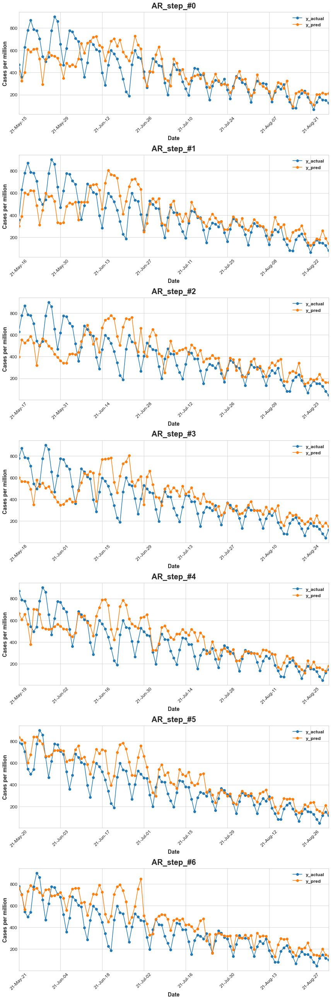

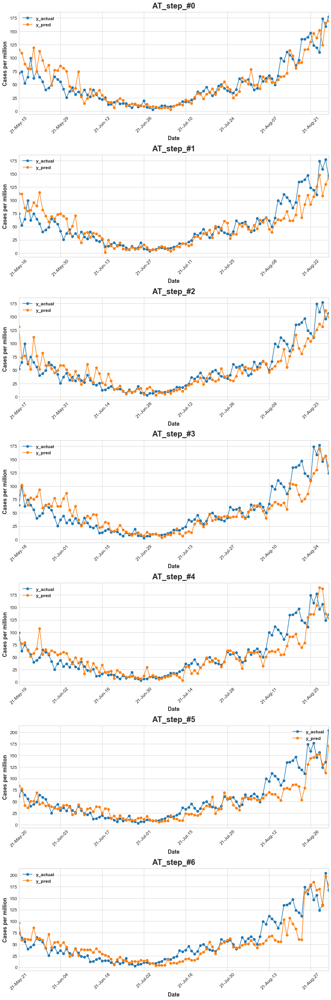

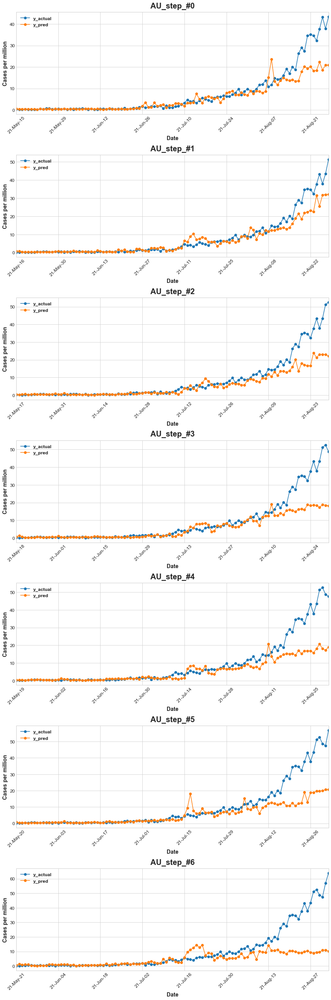

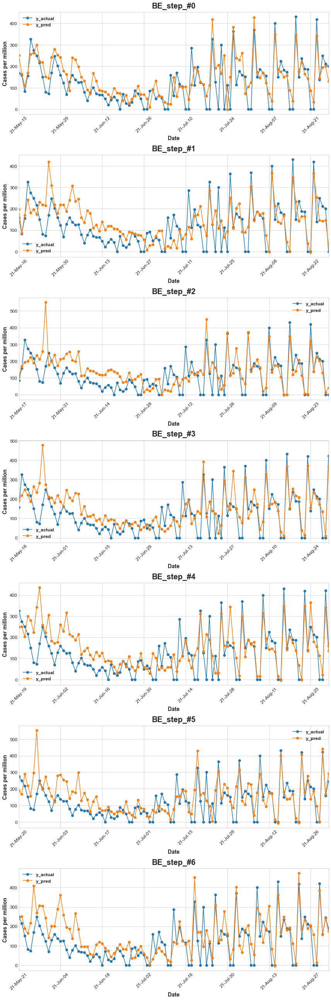

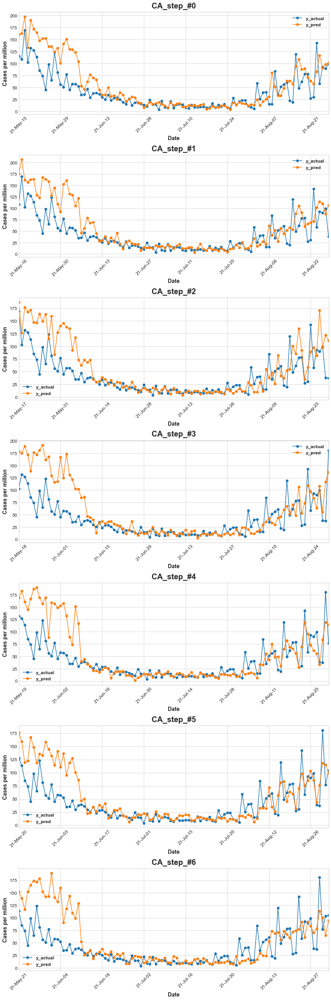

...

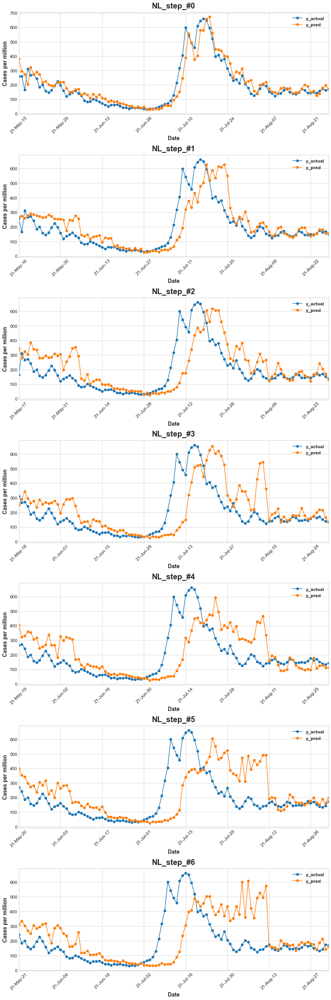

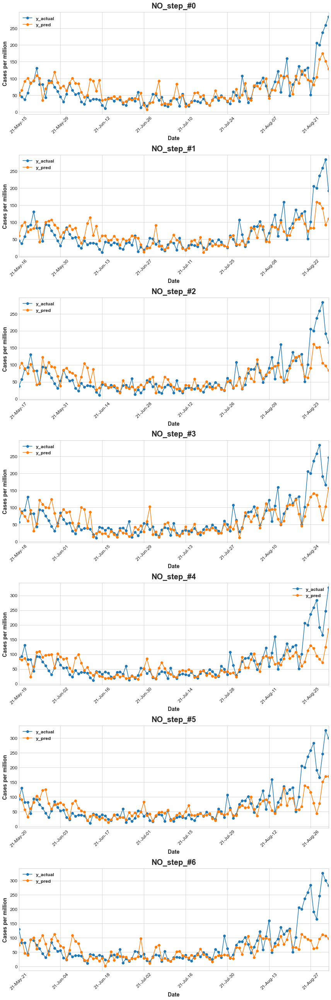

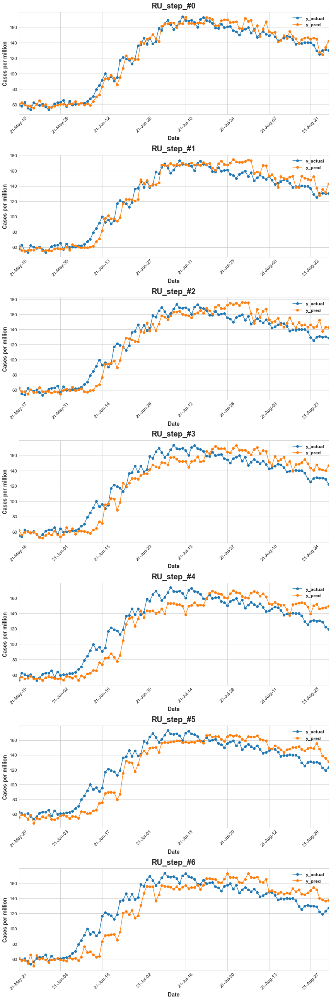

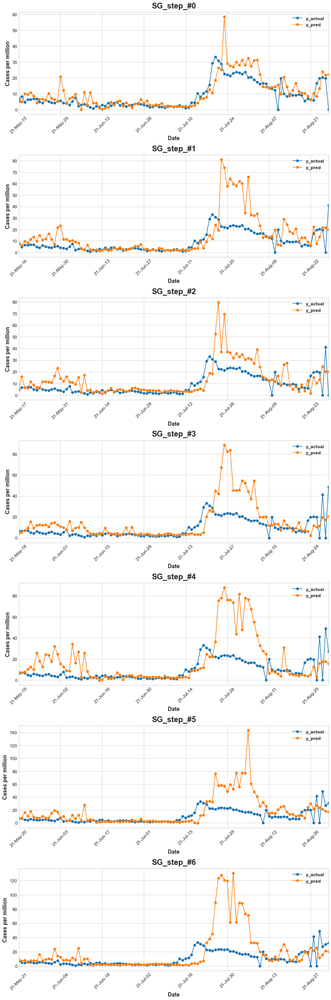

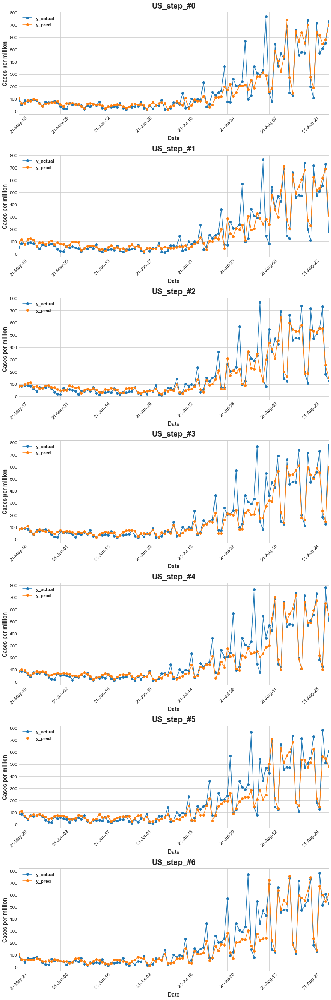

In [15]:
plot_actual_predicted(rez_country_xgbr_7d['validation'], dict_country, 'val', n_steps_out=7)

#### 1.7.3 Visualize the tree <a id='1.7.3'></a>

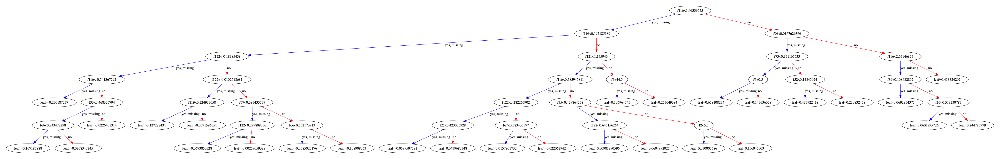

In [30]:
# visualize a decision tree of the XGBoost regressor using its own plot_tree function
fig, ax = plt.subplots(figsize=(20, 10), dpi=600)
plot_tree(rez_country_xgbr_7d['train'][country]['model'], num_trees=1, ax=ax)
plt.show()
fig.savefig(os.path.join('/Users/parkj/Documents/pyDat/dataSet/covid19_forecasting/covid19_figures/xgboost', \
                         'plot_tree_'+country+'_'+'_xgbr_7d.pdf'), tranparent=True, dpi=1200)

#### 1.7.4 Visualize feature importance <a id='1.7.4'></a>

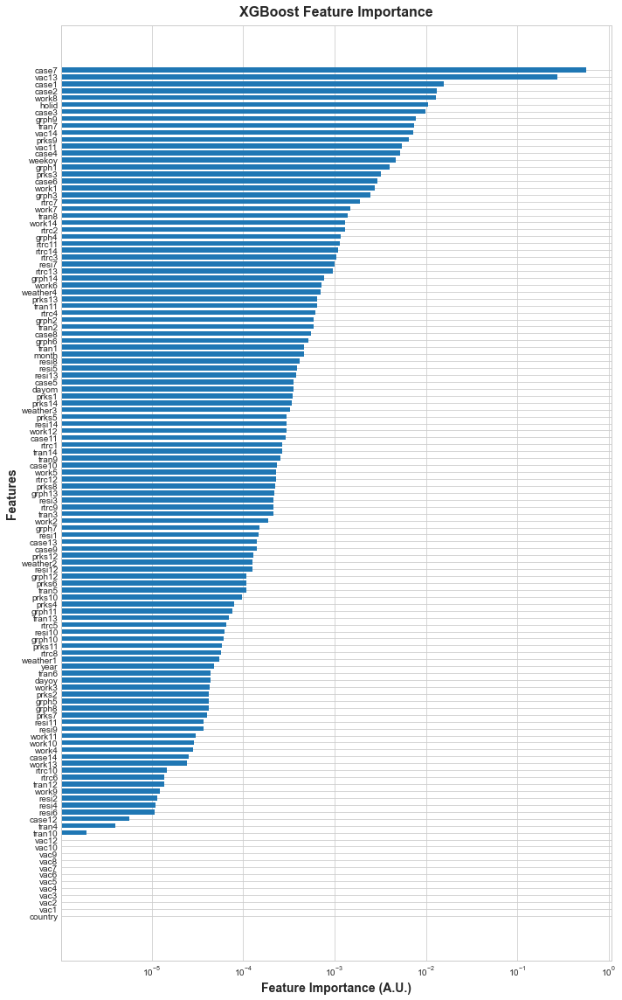

In [48]:
# sort features based on feature importances
sorted_idx = rez_country_xgbr_7d['train'][country]['model'].feature_importances_.argsort()
# plot feature importance
fig = plt.figure(figsize=(10,16))
ax = fig.add_subplot(1,1,1)

#plt.rc("figure", autolayout=True, figsize=(10, 16))
ax.barh(np.asarray(feature_name_list)[sorted_idx], \
         rez_country_xgbr_7d['train'][country]['model'].feature_importances_[sorted_idx],\
         height=0.7)
ax.set_xlabel("Feature Importance (A.U.)")
ax.set_ylabel("Features")
ax.set_title("XGBoost Feature Importance")
ax.set_xscale('log')
#plt.xlim([0, 0.001])
plt.show()
fig.savefig(os.path.join('/Users/parkj/Documents/pyDat/dataSet/covid19_forecasting/covid19_figures/xgboost', \
                         'Feature_importance_'+country+'_'+'_xgbr_7d.pdf'), tranparent=True, dpi=1200)